In [1]:
import os
import numpy as np
import PIL.Image as Img
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
from jyquickhelper import add_notebook_menu
from tqdm.notebook import tqdm
from shutil import copyfile
from random import seed
from time import time

In [2]:
seed(0)

In [3]:
image_size = 48
ngf = 256  # nb of feature map in generator
ndf = 32  # nb of feature map in dicriminator
nz = 50  # dimension of latent vectorial space
nc = 3  # nombre de channels en sortie
lr = 0.000008  #learning rate

In [4]:
from torchvision.transforms.functional import resize

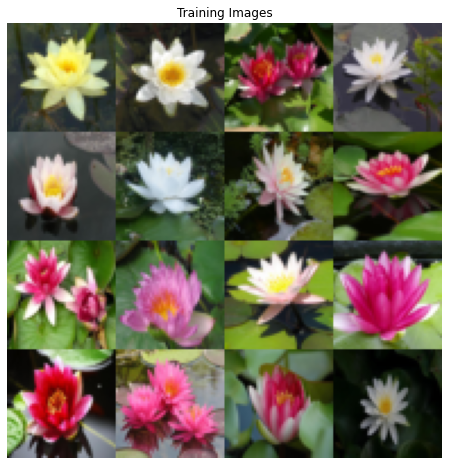

In [5]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets
from torchvision import utils as vutils
from torchvision.transforms.functional import resize


def adjust_im_size(image):
    return resize(image, (image_size, image_size))


dataroot = 'data'
batch_size = 30

dataset = datasets.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   adjust_im_size,
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5),
                                                        (0.5, 0.5, 0.5))
                               ]))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

device = torch.device('cuda')

real_batch = next(iter(dataloader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(
    np.transpose(
        vutils.make_grid(real_batch[0].to(device)[:16],
                         padding=0,
                         normalize=True,
                         nrow=4).cpu(), (1, 2, 0)))
plt.savefig('./training_example.png')
plt.show()

In [6]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
class Generator(nn.Module):
    def __init__(self, nz, img_size=image_size):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz,
                               ngf * 4,
                               int(img_size / 8),
                               1,
                               0,
                               bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh(),
        )

    def forward(self, X):
        return self.main(X)

In [8]:
from torchsummary import summary

netG = Generator(nz).to(device)
netG.apply(weights_init)

summary(netG, input_size=(nz, 1, 1), device='cuda')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 6, 6]       1,843,200
       BatchNorm2d-2           [-1, 1024, 6, 6]           2,048
         LeakyReLU-3           [-1, 1024, 6, 6]               0
   ConvTranspose2d-4          [-1, 512, 12, 12]       8,388,608
       BatchNorm2d-5          [-1, 512, 12, 12]           1,024
         LeakyReLU-6          [-1, 512, 12, 12]               0
   ConvTranspose2d-7          [-1, 256, 24, 24]       2,097,152
       BatchNorm2d-8          [-1, 256, 24, 24]             512
         LeakyReLU-9          [-1, 256, 24, 24]               0
  ConvTranspose2d-10            [-1, 3, 48, 48]          12,288
             Tanh-11            [-1, 3, 48, 48]               0
Total params: 12,344,832
Trainable params: 12,344,832
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Fo

In [9]:
class Discriminator(nn.Module):
    def __init__(self, img_size=image_size):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1,
                      bias=False),  # chaque image de taille (nc=3, 96, 96)
            nn.LeakyReLU(0.2, inplace=True),
            # sortie (ndf, 60, 60) (taille/2 par la convolution sans padding)
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # sortie (2*ndf, 30, 30)
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # sortie (4*ndf, 15, 15)
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # sortie (8*ndf, 6, 6)
            nn.Conv2d(ndf * 8, 1, int(img_size / 16), 1, 0, bias=False),
            #sortie (1, 1, 1 )
            nn.Sigmoid())

    def forward(self, X):
        return self.main(X)

In [10]:
netD = Discriminator().to(device)
netD.apply(weights_init)

summary(netD, input_size=(3, image_size, image_size), device='cuda')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 24, 24]           1,536
         LeakyReLU-2           [-1, 32, 24, 24]               0
            Conv2d-3           [-1, 64, 12, 12]          32,768
       BatchNorm2d-4           [-1, 64, 12, 12]             128
         LeakyReLU-5           [-1, 64, 12, 12]               0
            Conv2d-6            [-1, 128, 6, 6]         131,072
       BatchNorm2d-7            [-1, 128, 6, 6]             256
         LeakyReLU-8            [-1, 128, 6, 6]               0
            Conv2d-9            [-1, 256, 3, 3]         524,288
      BatchNorm2d-10            [-1, 256, 3, 3]             512
        LeakyReLU-11            [-1, 256, 3, 3]               0
           Conv2d-12              [-1, 1, 1, 1]           2,304
          Sigmoid-13              [-1, 1, 1, 1]               0
Total params: 692,864
Trainable params:

In [11]:
loss = nn.BCELoss()

fixed_noise = torch.randn(
    64, nz, 1, 1,
    device=device,)  # pour faire une animation du progrès du générateur

# label convention

real_label = 1.
generated_label = 0.

In [12]:
# Setup les optimiseurs Adam pour G et D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

In [13]:
#netG.load_state_dict(torch.load('models/flower_generator_weights.pth'))
#netD.load_state_dict(torch.load('models/flower_discriminator_weights.pth'))

In [14]:
img_list = []
G_losses = []
D_losses = []
runtime = 0

In [15]:
iters = 0
num_epochs = 2000
runtime += 1
for epoch in tqdm(range(num_epochs)):
    for i, data in enumerate(dataloader, 0):
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z))) = ylogx + (1-y)log(1-x)
        netD.zero_grad()
        # format des batchs
        real_sample = data[0].to(device)
        b_size = real_sample.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # passage des échantillons réels dans le discriminant
        output = netD(real_sample).view(-1)
        err_D_real = loss(output, label)
        
        # calcul du gradient en backpropagation
        err_D_real.backward()
        
        D_x = output.mean().item() # esperance de D sur les échantillons réels
        
        
        # création d'échantillons fake à partir d'un bruit gaussien (autant que d'échantillons réels)
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(generated_label)
        
        # passage des échantillons générés dans le discriminant
        output = netD(fake).view(-1)
        err_D_fake = loss(output, label)
        
        #calcul du gradient
        err_D_fake.backward()
        D_G_z1 = output.mean().item() # espérance de D sur les échantillons générés par G (à partir du bruit z1)
        
        err_D = err_D_fake + err_D_real
        
        # update D
        optimizerD.step()
        
        # (2) Update G Network : maximize log(D(G(x))) = ylogx + (1-y)log(1-x)
        
        netG.zero_grad()
        fake = netG(noise)
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake).view(-1)
        
        err_G = loss(output, label)
        #calcul du gradient
        err_G.backward()
        D_G_z2 = output.mean().item() # espérance de D sur les échantillons générés par G (à partir du bruit z2)
                
        # update G
        optimizerG.step()
        
        
        G_losses.append(err_G.item())
        D_losses.append(err_D.item())
        if (iters % (len(dataloader)*num_epochs//20) == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG( fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake[:25], padding=0, normalize=True, nrow=5))

        iters += 1

  0%|          | 0/2000 [00:00<?, ?it/s]

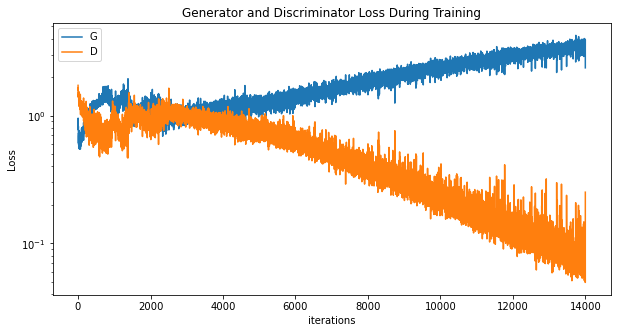

In [16]:
plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.yscale('log') 
plt.legend()
plt.show()

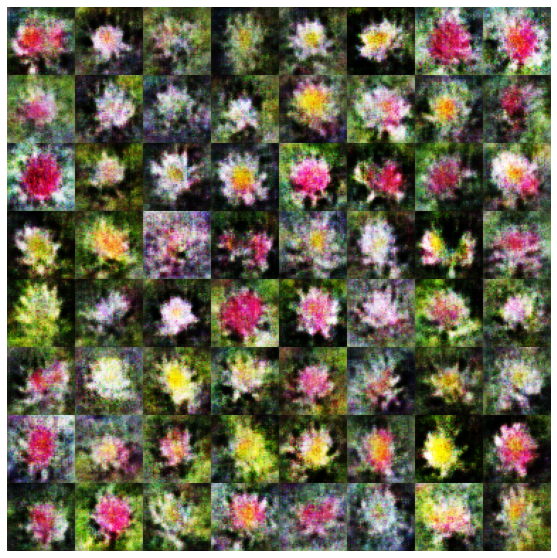

In [17]:
fig = plt.figure(figsize=(10, 10))
fake = netG(fixed_noise)
plt.imshow(
    np.transpose(
        vutils.make_grid(fake[:64].cpu(), padding=0, normalize=True, nrow=8),
        (1, 2, 0)))
plt.axis('off')
plt.savefig("./outputs/exemple_output.png")

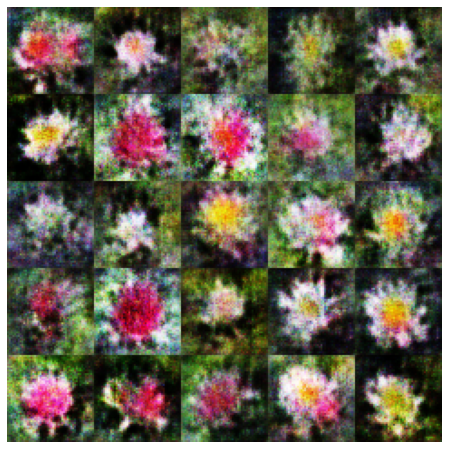

In [18]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i, (1, 2, 0)), animated=True)]
       for i in img_list[::runtime]]
ani = animation.ArtistAnimation(fig,
                                ims,
                                interval=100,
                                repeat_delay=200,
                                blit=True)

HTML(ani.to_jshtml())

In [19]:
torch.save(netG.state_dict(), "models/flower_generator_weights.pth")  
torch.save(netD.state_dict(), "models/flower_discriminator_weights.pth") 

In [20]:
unloader = transforms.ToPILImage()

In [21]:
imgs = (unloader(im.clone().squeeze(0)) for im in img_list[::runtime])
img = next(imgs)
img.save(fp='./outputs/learning.gif',
         format='GIF',
         append_images=imgs,
         save_all=True,
         duration=200,
         loop=0)

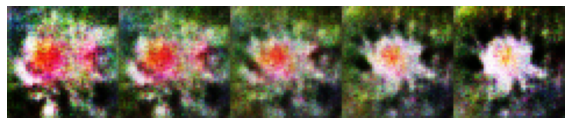

In [22]:
point1 = fixed_noise[0].cpu().detach().numpy()
point2 = fixed_noise[1].cpu().detach().numpy()

lambs = np.linspace(0, 1, 5).reshape(-1, 1)

transition = np.array([point1 * (1 - lamb) + point2 * lamb for lamb in lambs])
transition = transition.reshape(5, nz, 1, 1)
transition = torch.from_numpy(transition).to(device).float()

transition_image = netG(transition).cpu().detach()

plt.figure(figsize=(10, 10))
plt.imshow(
    np.transpose(
        vutils.make_grid(transition_image.cpu(),
                         padding=0,
                         normalize=True,
                         nrow=5), (1, 2, 0)))
plt.axis('off')
plt.savefig('./outputs/transition.png')
plt.show()